In [1]:
using SparseArrays: spdiagm
using LinearAlgebra
using Plots
using Polynomials
using LaTeXStrings
     
function Simpson(fn,h)
    N = length(fn)
    sum = ( fn[1]+ fn[N] ) 
    
    for i=2:N-1
        sum+= (4-2*(i%2))*fn[i]
    end
    
    sum = h*sum/3
return sum
end

function Normalise(Psi,dx)
    return Psi/sqrt(Simpson([p*conj(p) for p in Psi],dx))
end

function Coefficients(r)
B = zeros(r,r)
for i =1:r
    for j =1:r
        B[i,j] = 2 * (i)^(2*j) / factorial(2*j)
    end
end  
Bi=B^-1;
colm=Bi*ones(r)*(-2);
ck =Bi[1,:];                      
return cat(colm[1],ck,dims=1)      
end
(Coefficients(2))

3-element Vector{Float64}:
 -2.5
  1.3333333333333333
 -0.08333333333333331

In [2]:
h = 1              # Plank's Constant
m = 1/2            # mass of particle

dx = 0.01          # spatial  step-size
dt = 0.05           # temporal step-size

L = 10            
x = 0:dx:L  
J = length(x)      # space intervals
N = 500            # time intervals

r=1                #defining r in 2r+1 formula
       

1

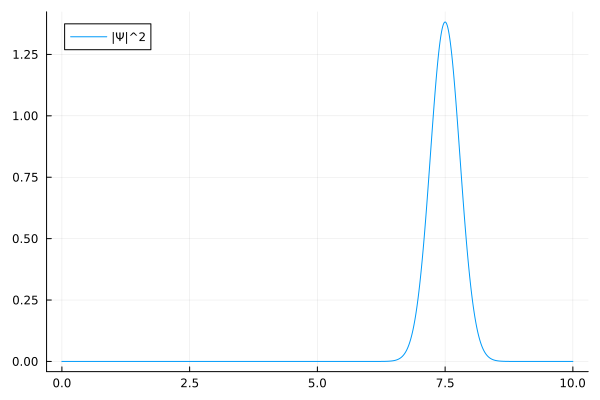

In [3]:
Psi = @. exp(-im*20*x)*exp(-3*(x-7.5)^2) #initial state vector
Psi = Normalise(Psi,dx)

#plot(x,real(conj(Psi).*Psi))
plot(x,abs.(conj(Psi).*Psi);label="|Ψ|^2")

[ Info: Saved animation to /Users/aaghazmahajan/Wavefunc_evol.gif


Plots.AnimatedGif("/Users/aaghazmahajan/Wavefunc_evol.gif")
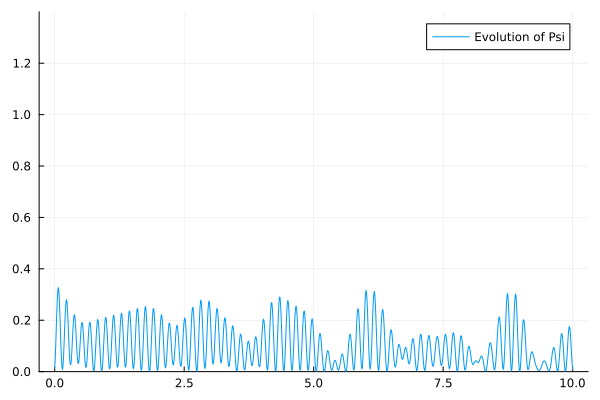

In [7]:
D =spdiagm(J,J, 1=> ones(J-1),0 => ones(J)*-1) ;
DPsi = D*Psi
plot(x,real.(DPsi);label="Re Ψ'")

c=Coefficients(r)

# Defining the second order derivative matrix
coeff=[c[abs(i)+1]*ones(J-abs(i)) for i=-r:r ] 
pos=collect(-r:r)
D2=spdiagm(J,J,(pos.=>coeff)...)/(dx^2)

D2Psi = D2*Psi
plot(x,real.(D2Psi);label="Re Ψ''")

pot=zeros(J)
V=spdiagm(J,J,0=> pot)

# Defining some constants
b = im*dt/(2*m)
z1 = -2

# Defining A and Aconj
A      = I(J) + (b/z1)*D2 -((im*dt/h)/z1)*V
Aconj  = conj(A)

# Evolving the system
PSI = zeros(J,N)
PSI = complex(PSI)
PSI[:,1] = Psi
for i=2:N
    rhs=Aconj*Psi
    sol = A\rhs
    PSI[:,i] = sol
    Psi = sol
end

anim = @animate for i = 1:N
   plot(x,abs.(conj(PSI[:,i]).*PSI[:,i]);label="Evolution of Psi",ylimit = (0,1.4))
end

gif(anim, "Wavefunc_evol.gif", fps = 50)
     

[ Info: Saved animation to /Users/aaghazmahajan/Wavefunc_evol_Pade.gif


Plots.AnimatedGif("/Users/aaghazmahajan/Wavefunc_evol_Pade.gif")
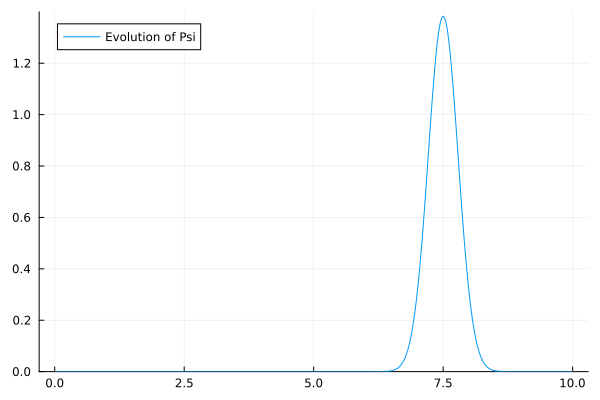

In [9]:
function roots_Pade(M)   
    X = zeros(M,M)
    B = zeros(1,M)
    A = zeros(M,1)
    for i = 1:M
        m = M + i 
        A[i,1] = -1/factorial(m) 
        for j = 1:M
            m = m - 1
            X[i,j] = 1/(factorial(m))
        end
    end
    B = inv(X)*A;
    
    Poly = Polynomial([1;B], :z)           
    R = roots(Poly);                       
    R = -conj(R)                         
    return R
end
M=2
roots_list = roots_Pade(M)   
pot=zeros(J)
V=spdiagm(J,J,0=> pot)
dt = 0.1
b = im*dt/(2*m)
Psi = @. exp(-im*20*x)*exp(-3*(x-7.5)^2) #initial state vector
Psi = Normalise(Psi,dx)
PSI = zeros(J,N)
PSI = complex(PSI)
PSI[:,1] = Psi

for i=2:N
    for s=1:M
        # Defining A and Aconj
        A      = I(J) + (b/roots_list[s])*D2 -((im*dt/h)/roots_list[s])*V
        Aconj  = conj(A)
        
        # Finding Psi(n+1)
        rhs = Aconj*Psi
        sol = A\rhs
        Psi = sol
    end
    PSI[:,i] = Psi
end
anim = @animate for i = 1:N
   plot(x,abs.(conj(PSI[:,i]).*PSI[:,i]);label="Evolution of Psi",ylimit = (0,1.4))
end

gif(anim, "Wavefunc_evol_Pade.gif", fps = 50)
    